## Fetching Data

We are using the Reddit API to fetch data from a bunch of programming, computer science and data science related subreddits.

In [1]:
# Import Libraries
import requests
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import nltk
import html
import re
from nltk.corpus import stopwords
from nltk.stem import SnowballStemmer
from sklearn.feature_extraction.text import TfidfVectorizer
warnings.filterwarnings('ignore')
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/lucifer/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /Users/lucifer/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [2]:
# Define Subreddit List
subreddits = ['python', 'datascience', 'javascript', 'linux', 'opensource', 'node', 'programming', 'computerscience', 'webdev', 'statistics', 'MachineLearning', 'compsci', 'java', 'rust', 'typescript']

In [4]:
# Progress Bar Display Function
def progress (iteration, total, fill = '█'):
    printEnd = "\r"
    prefix = 'Downloading Data'
    suffix = 'Complete'
    decimals = 2
    length = 50
    downloaded = 100 * (iteration / float(total))
    percent = ("{0:." + str(decimals) + "f}").format(downloaded) if downloaded <= 100 else 100
    filledLength = int(length * iteration // total)
    bar = fill * filledLength + '-' * (length - filledLength)
    if downloaded <= 100:
        print(f'\r{prefix} |{bar}| {percent}% {suffix}', end = printEnd)

# Data Fetcher Class
class DataFetcher:
    posts = []
    after = None
    downloaded = 0

    def __init__(self, posts_per_subreddit=100):
        client_id = 'dog1LGxsD9M3bXtglOzKsQ'
        client_secret = 'nc-HHPBGtz51-_r4vNLGcuCHmT39Lw'
        username = 'NoSeason1949'
        password = 'Password@1234'
        auth = requests.auth.HTTPBasicAuth(client_id, client_secret)
        data = {
            'grant_type': 'password',
            'username': username,
            'password': password,
        }
        headers = {'User-Agent': 'RedditTest/0.1 by {}'.format(username)}
        res = requests.post('https://www.reddit.com/api/v1/access_token',
                            auth=auth, data=data, headers=headers)
        self.token = res.json()['access_token']
        self.headers = {**headers, **{'Authorization': f"bearer {self.token}"}}
        self.subreddits = subreddits
        self.posts_per_subreddit = posts_per_subreddit

    def fetch(self):
        for subreddit in self.subreddits:
            subreddit_download = 0
            while subreddit_download < self.posts_per_subreddit:
                url = f"https://oauth.reddit.com/r/{subreddit}/hot?limit=100"
                if self.after:
                     url += f"&after={self.after}"
                res = requests.get(url, headers=self.headers)
                if res.status_code == 200:
                    data = res.json()
                    for post in data['data']['children']:
                        self.posts.append(post['data'])
                        subreddit_download += 1
                        self.downloaded += 1
                        progress(self.downloaded, len(subreddits) * self.posts_per_subreddit)
                    self.after = data['data']['after']
                else:
                    print('Failed on subreddit: {}, with status code: {}'.format(subreddit, res.status_code))
                    break

    def get_data(self):
        return self.posts

# Fetch Data
data_fetcher = DataFetcher(posts_per_subreddit=100)
data_fetcher.fetch()


In [6]:
# Dataframe
df = pd.DataFrame(data_fetcher.get_data())
df.head()

,approved_at_utc,subreddit,selftext,author_fullname,saved,mod_reason_title,gilded,clicked,title,link_flair_richtext,...,post_hint,preview,media_metadata,url_overridden_by_dest,author_cakeday,crosspost_parent_list,crosspost_parent,is_gallery,gallery_data,call_to_action
0,None,Python,"It's December, which means it's time for [Adve...",t2_9iikd,False,None,0,False,/r/Python's 2022 Advent of Code,"[{'e': 'text', 't': 'News'}]",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,None,Python,Discussion of using Python in a professional e...,t2_145f96,False,None,0,False,"Thursday Daily Thread: Python Careers, Courses...","[{'e': 'text', 't': 'Daily Thread'}]",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,None,Python,I just published the [Python Data Science Dece...,t2_4ei3rm7y,False,None,0,False,Python Data Science December,"[{'e': 'text', 't': 'Beginner Showcase'}]",...,self,{'images': [{'source': {'url': 'https://extern...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,None,Python,"Any library/framework (pygame, kivy, Ursina, e...",t2_x23yv,False,None,0,False,Any open source games written in Python? Ideal...,"[{'e': 'text', 't': 'Discussion'}]",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,None,Python,Im super excited about this. I have been leari...,t2_64896tmr,False,None,0,False,I made a program that takes a signal from a po...,"[{'e': 'text', 't': 'Beginner Showcase'}]",...,self,{'images': [{'source': {'url': 'https://extern...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [1108]:
# Check Shape
df.shape

(15890, 118)

In [1109]:
# Dtypes
df.dtypes

approved_at_utc     object
subreddit           object
selftext            object
author_fullname     object
saved                 bool
                     ...  
crosspost_parent    object
is_gallery          object
gallery_data        object
poll_data           object
call_to_action      object
Length: 118, dtype: object

## Data Cleaning & Preprocessing

We are going to preprocess the data by removing the stop words, punctuations and lemmatizing the words.

In [1110]:
# Print Column Values
print(list(df.columns.values))

['approved_at_utc', 'subreddit', 'selftext', 'author_fullname', 'saved', 'mod_reason_title', 'gilded', 'clicked', 'title', 'link_flair_richtext', 'subreddit_name_prefixed', 'hidden', 'pwls', 'link_flair_css_class', 'downs', 'thumbnail_height', 'top_awarded_type', 'hide_score', 'name', 'quarantine', 'link_flair_text_color', 'upvote_ratio', 'author_flair_background_color', 'subreddit_type', 'ups', 'total_awards_received', 'media_embed', 'thumbnail_width', 'author_flair_template_id', 'is_original_content', 'user_reports', 'secure_media', 'is_reddit_media_domain', 'is_meta', 'category', 'secure_media_embed', 'link_flair_text', 'can_mod_post', 'score', 'approved_by', 'is_created_from_ads_ui', 'author_premium', 'thumbnail', 'edited', 'author_flair_css_class', 'author_flair_richtext', 'gildings', 'content_categories', 'is_self', 'mod_note', 'created', 'link_flair_type', 'wls', 'removed_by_category', 'banned_by', 'author_flair_type', 'domain', 'allow_live_comments', 'selftext_html', 'likes', '

In [1111]:
# Finding Saturated Columns – Columns with same values in all rows
saturated_cols = []
for col in df.columns:
    first_value = df[col].iloc[0]
    if df[col].equals(pd.Series([first_value] * len(df[col]))):
        saturated_cols.append(col)

print(saturated_cols)

# At this point, we can drop the saturated columns as they don't provide any useful information
df.drop(saturated_cols, axis=1, inplace=True)

['approved_at_utc', 'saved', 'mod_reason_title', 'clicked', 'hidden', 'pwls', 'downs', 'top_awarded_type', 'quarantine', 'subreddit_type', 'user_reports', 'is_meta', 'can_mod_post', 'approved_by', 'is_created_from_ads_ui', 'content_categories', 'mod_note', 'removed_by_category', 'banned_by', 'likes', 'banned_at_utc', 'view_count', 'is_crosspostable', 'pinned', 'awarders', 'media_only', 'treatment_tags', 'visited', 'removed_by', 'num_reports', 'author_is_blocked', 'mod_reason_by', 'removal_reason', 'is_robot_indexable', 'report_reasons', 'discussion_type', 'mod_reports', 'parent_whitelist_status']


In [1112]:
# Replace all NaN values with 0 if the column is numeric or empty string if the column is string
for col in df.columns:
    if df[col].dtype == 'float64' or df[col].dtype == 'int64':
        df[col].fillna(0, inplace=True)
    if df[col].dtype == 'object':
        df[col].fillna('', inplace=True)

In [1113]:
# Convert column to string if column is not numeric or boolean
for col in df.columns:
    if df[col].dtype != 'float64' and df[col].dtype != 'int64' and df[col].dtype != 'bool':
        df[col] = df[col].astype(str)

In [1114]:
# Check for title duplicates
print('Duplicate titles: {}'.format(df['title'].duplicated().sum()))

# Same post data can be repeated from the API -Delete titles that appear more than once
df.drop_duplicates(subset=['title'], keep='first', inplace=True)

Duplicate titles: 7287


In [1115]:
# Print columns with missing values and their count - Should be empty list, ie. no missing values
print(list(df.isnull().sum()[df.isnull().sum() > 0]))

[]


In [1116]:
# Handling Flair Columns - We only need the flair texts

# Supplimentary Column Search Function
def search(array, search_term):
    """
    Returns a list of strings that contain the search term.
    """
    return [string for string in array if search_term in string]

# Find all columns that contain 'flair'
columns = list(df.columns)
flair_columns = search(columns, 'flair')
# remove everything from df columns except link_flair_text and author_flair_text
flair_columns = list(filter(lambda x: x not in ['link_flair_text', 'author_flair_text'], flair_columns))
df.drop(flair_columns, axis=1, inplace=True)

In [1117]:
# Any rows containing [deleted] and [removed] are not useful for our analysis. Find any rows with these values and drop them.
columns = list(df.columns)
for column in columns:
    df = df[df[column] != '[deleted]']
    df = df[df[column] != '[removed]']

In [1118]:
# Remove all posts which are polls - where poll_data is not ""
df = df[df['poll_data'] == '']

In [1119]:
cols_to_drop = ['author_fullname', 'subreddit_name_prefixed', 'name', 'hide_score', 'media_embed', 'thumbnail_height', 'thumbnail_width', 'category', 'thumbnail', 'edited', 'gildings', 'wls', 'domain', 'allow_live_comments', 'selftext_html', 'suggested_sort', 'archived', 'all_awardings', 'can_gild', 'subreddit_id', 'id', 'whitelist_status', 'permalink', 'url', 'created', 'media', 'post_hint', 'preview', 'media_metadata', 'url_overridden_by_dest', 'call_to_action', 'author_cakeday', 'crosspost_parent_list', 'crosspost_parent', 'poll_data', 'is_gallery', 'gallery_data', 'secure_media', 'secure_media_embed']
df.drop(cols_to_drop, axis=1, inplace=True)

In [1120]:
# "distinguished" coloumn has 2 values - "moderator" and "" - We can convert this to a boolean column
df['distinguished'] = df['distinguished'].apply(lambda x: True if x == 'moderator' else False)

In [1121]:
# Convert author_premium to boolean
df['author_premium'] = df['author_premium'].apply(lambda x: True if x == True else False)

## Exploratory Data Analysis

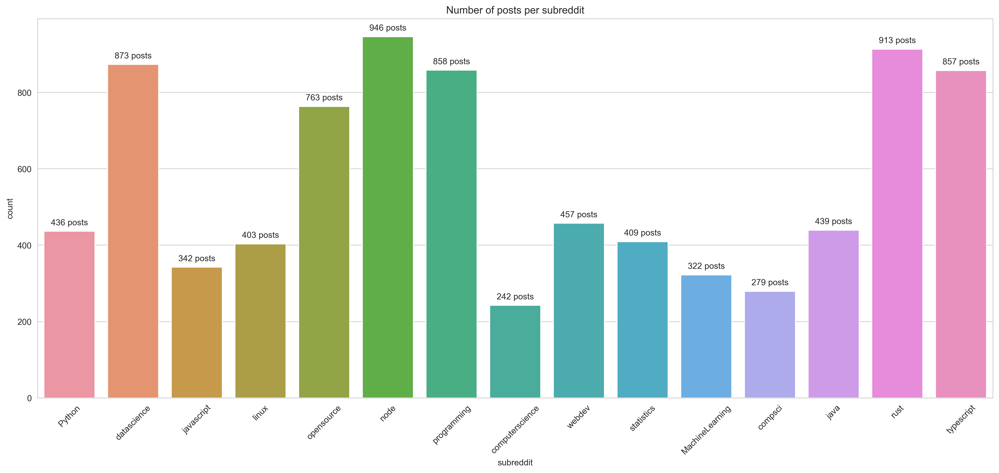

In [1122]:
# Plot Number of posts per subreddit with the count of posts beside each bar
plt.figure(figsize=(20, 8))
plt.rcParams['figure.dpi'] = 300
plt.title('Number of posts per subreddit')
plt.xlabel('Subreddit')
plt.ylabel('Number of posts')
plt.xticks(rotation=45)
sns.countplot(x='subreddit', data=df)
for p in plt.gca().patches:
    plt.gca().annotate('{:1.0f} posts'.format(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()), 
                       ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')
plt.show()

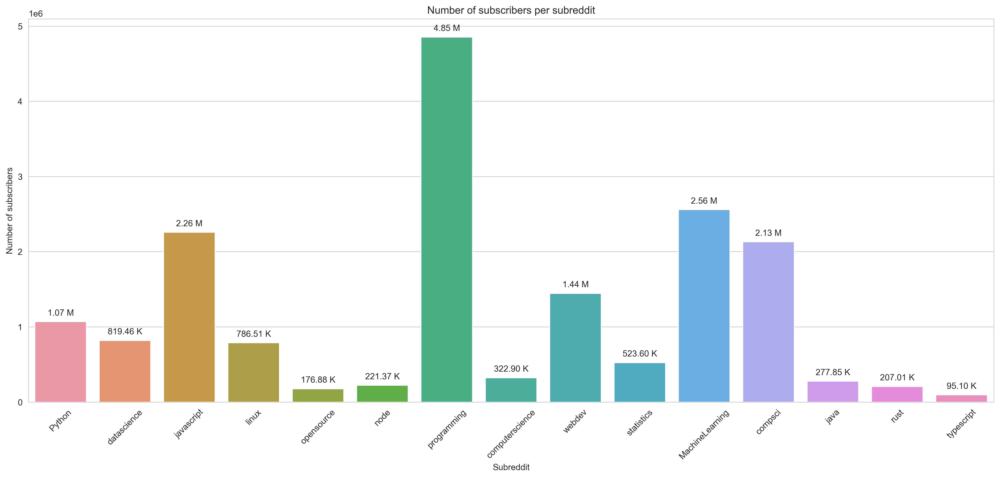

In [1123]:
# Number of subscribers per subreddit
def pretty_number(number):
    # Convert number to in B, M, K format
    if number >= 1000000000:
        return '{:.2f} B'.format(number / 1000000000)
    elif number >= 1000000:
        return '{:.2f} M'.format(number / 1000000)
    elif number >= 1000:
        return '{:.2f} K'.format(number / 1000)
    else:
        return number

plt.figure(figsize=(20, 8))
plt.rcParams['figure.dpi'] = 300
sns.barplot(x='subreddit', y='subreddit_subscribers', data=df)
for p in plt.gca().patches:
    plt.gca().annotate('{}'.format(pretty_number(p.get_height())), (p.get_x() + p.get_width() / 2., p.get_height()),
                          ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')
plt.title('Number of subscribers per subreddit')
plt.xlabel('Subreddit')
plt.ylabel('Number of subscribers')
plt.xticks(rotation=45)
plt.show()

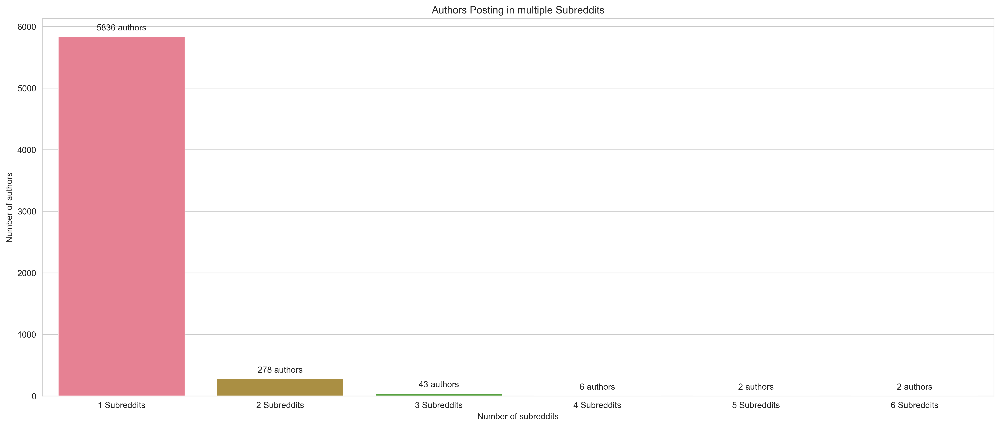

In [1124]:
# Number of Authors who post in multiple subreddits
n_subreddits = df.groupby('author')['subreddit'].nunique()
plt.figure(figsize=(20, 8))
plt.rcParams['figure.dpi'] = 300
plt.title('Authors Posting in multiple Subreddits')
sns.countplot(x=n_subreddits, palette=sns.color_palette("husl"))
for p in plt.gca().patches:
    plt.gca().annotate('{:1.0f} authors'.format(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()),
                          ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')

plt.xlabel('Number of subreddits')
plt.ylabel('Number of authors')
x_tick_labels = list(map(lambda x: '{} Subreddits'.format(x) if x > 1 else '{} Subreddits'.format(x), list(range(1, len(n_subreddits.unique()) + 1))))
plt.xticks(list(range(0, len(n_subreddits.unique()))), x_tick_labels)
plt.show()

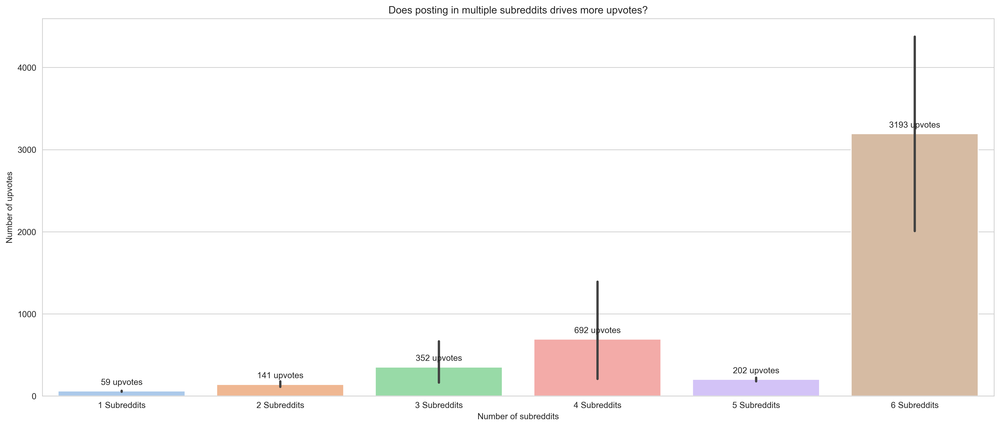

In [1125]:
# Does posting in multiple subreddits drives more upvotes?
n_subreddits = df.groupby('author')['subreddit'].nunique()
n_upvotes = df.groupby('author')['score'].sum()
plt.figure(figsize=(20, 8))
plt.rcParams['figure.dpi'] = 300
sns.barplot(x=n_subreddits, y=n_upvotes, palette=sns.color_palette("pastel"))
for p in plt.gca().patches:
    plt.gca().annotate('{:1.0f} upvotes'.format(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()),
                          ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')
plt.title('Does posting in multiple subreddits drives more upvotes?')
plt.xlabel('Number of subreddits')
plt.ylabel('Number of upvotes')
x_tick_labels = list(map(lambda x: '{} Subreddits'.format(x) if x > 1 else '{} Subreddits'.format(x), list(range(1, len(n_subreddits.unique()) + 1))))
plt.xticks(list(range(0, len(n_subreddits.unique()))), x_tick_labels)
plt.show()


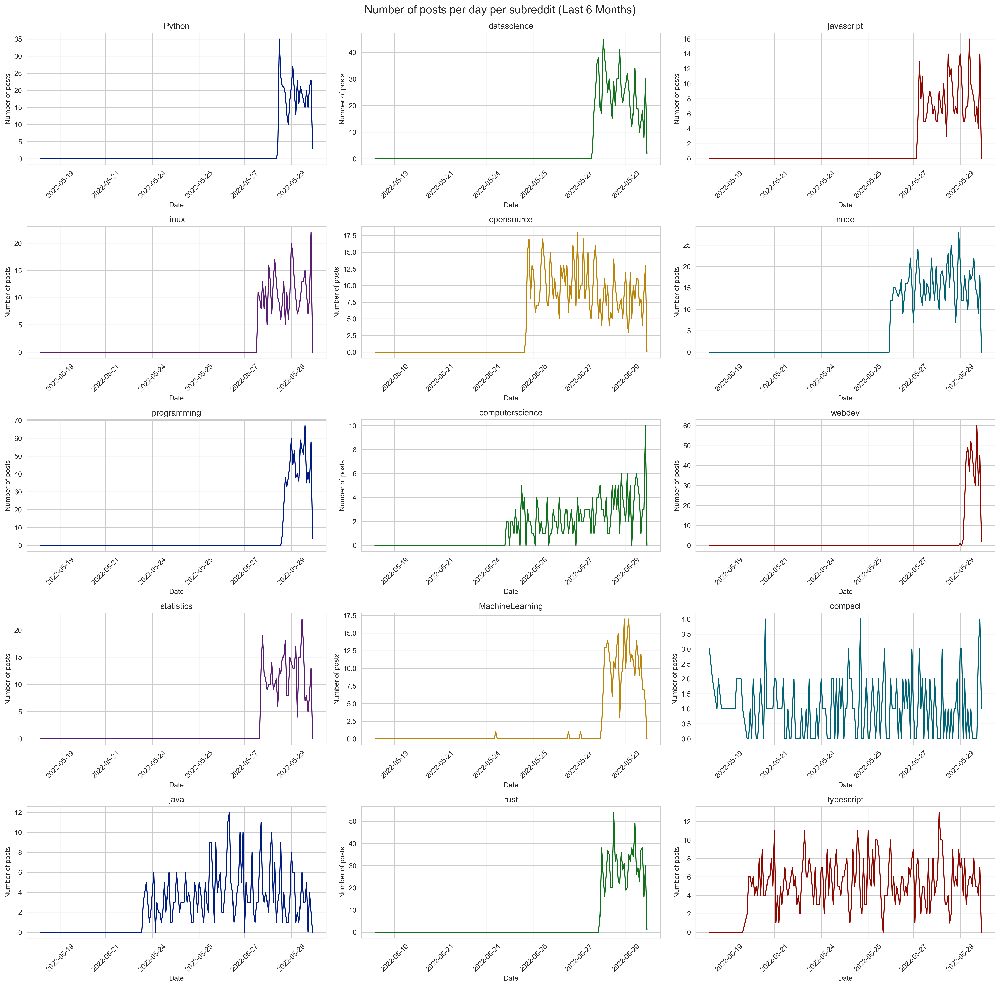

In [1126]:
# Number of posts per day per subreddit
posts_df = df.groupby(['subreddit', 'created_utc']).size().reset_index(name='counts')
posts_df['created_utc'] = pd.to_datetime(posts_df['created_utc'], unit='s')
posts_df['created_utc'] = posts_df['created_utc'].dt.date
posts_df = posts_df.groupby(['subreddit', 'created_utc']).sum().reset_index()
posts_df = posts_df.pivot(index='created_utc', columns='subreddit', values='counts')
posts_df = posts_df.fillna(0)

# Select dates after 2021-01-01
import datetime
last_6M = datetime.date.today() - datetime.timedelta(days=180)
posts_df = posts_df.loc[posts_df.index >= last_6M]

# Plot number of posts per day per subreddit
subreddits = df['subreddit'].unique()
palette = sns.color_palette("dark6", len(subreddits))
fig, ax = plt.subplots(5, 3, figsize=(20, 20))
fig.set_dpi(300)
fig.suptitle('Number of posts per day per subreddit (Last 6 Months)\n', fontsize=16)
for i, subreddit in enumerate(subreddits):
    row = i // 3
    col = i % 3
    sns.lineplot(x=posts_df.index, y=subreddit, data=posts_df, ax=ax[row, col], color=palette[i])
    ax[row, col].set_title(subreddit)
    ax[row, col].set_xlabel('Date')
    ax[row, col].set_ylabel('Number of posts')
    ax[row, col].set_xticklabels(posts_df.index, rotation=45)
plt.tight_layout()
plt.show()

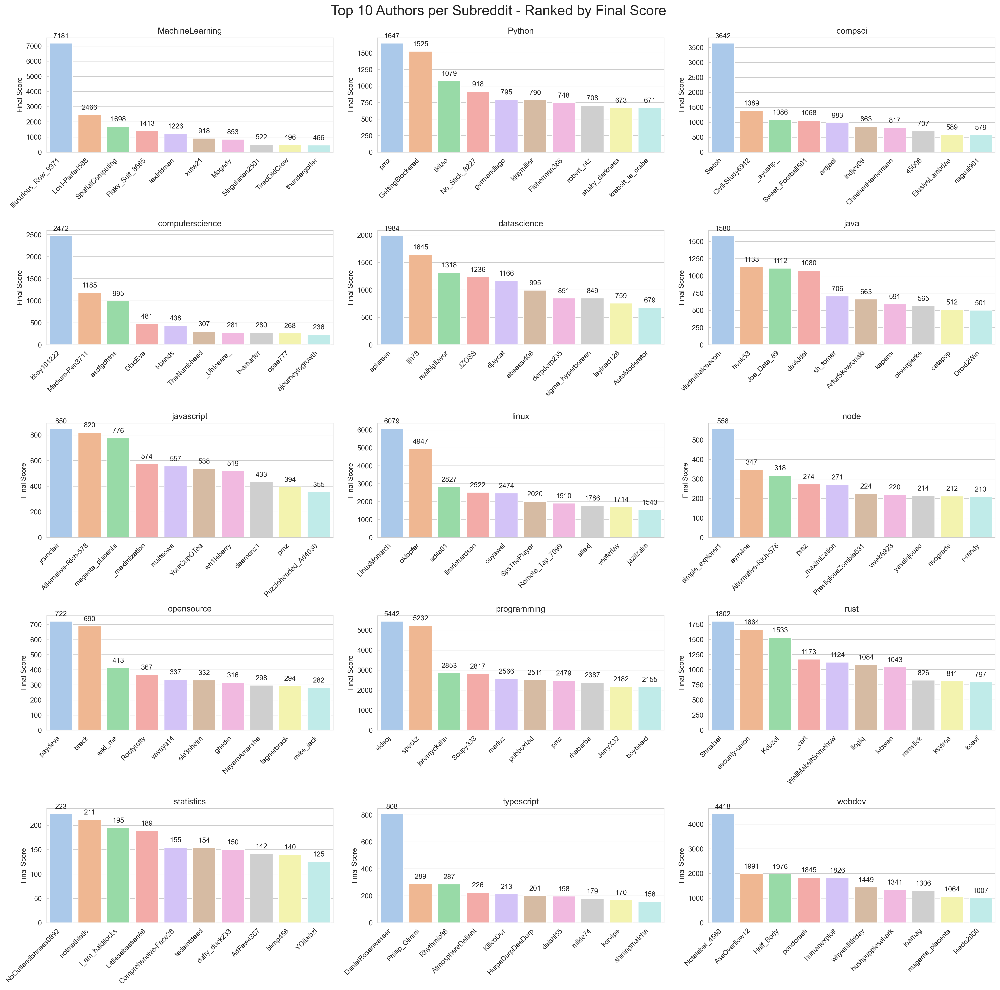

In [1127]:
# Author Scoring Function
def author_scores(df):
    df_author = df[['author', 'score', 'subreddit', 'num_comments', 'upvote_ratio']]
    df_author['final_score'] = df_author['score'] * df_author['upvote_ratio'] + df_author['num_comments']
    df_author = df_author.groupby(['author', 'subreddit']).sum()
    df_author = df_author.reset_index()
    return df_author

# Plotting the top 10 authors per subreddit
top_10_authors_per_subreddit = author_scores(df).groupby('subreddit').apply(lambda x: x.nlargest(10, 'final_score'))
top_10_authors_per_subreddit = top_10_authors_per_subreddit.reset_index(drop=True)
fig, axes = plt.subplots(5, 3, figsize=(20, 20))
fig.suptitle('Top 10 Authors per Subreddit - Ranked by Final Score\n', fontsize=20)
fig.dpi = 300
for i, subreddit in enumerate(top_10_authors_per_subreddit['subreddit'].unique()):
    sns.barplot(x='author', y='final_score', data=top_10_authors_per_subreddit[top_10_authors_per_subreddit['subreddit'] == subreddit], ax=axes[i//3, i%3], palette=sns.color_palette("pastel", 10))
    for p in axes[i//3, i%3].patches:
        axes[i//3, i%3].annotate('{:1.0f}'.format(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()),
                                  ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')
    axes[i//3, i%3].set_title(subreddit)
    axes[i//3, i%3].set_xticklabels(axes[i//3, i%3].get_xticklabels(), rotation=45, horizontalalignment='right')
    axes[i//3, i%3].set_xlabel('')
    axes[i//3, i%3].set_ylabel('Final Score')
plt.tight_layout()
plt.show()

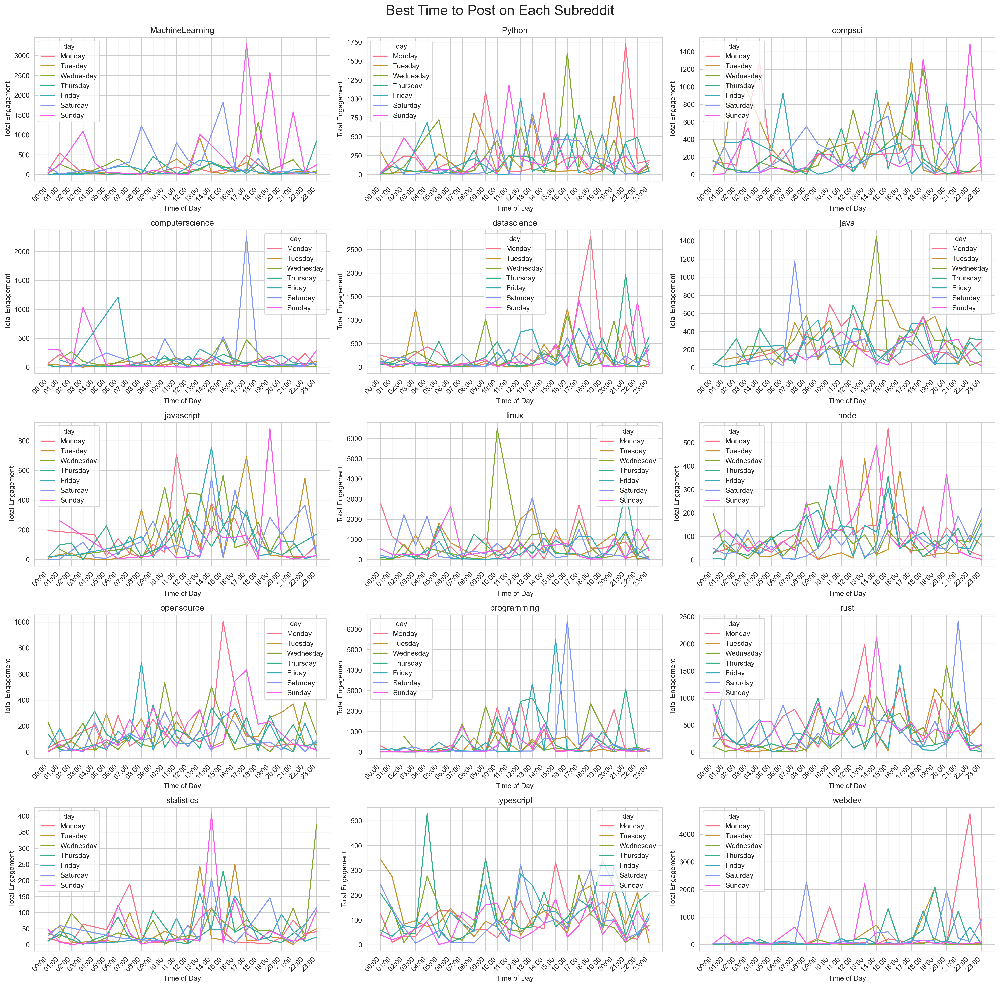

In [1128]:
# Finding the best time to post on each subreddit

best_time_df = df[['subreddit', 'created_utc', 'score', 'num_comments']]
best_time_df['final_score'] = best_time_df['score'] + best_time_df['num_comments']
best_time_df.drop(['score', 'num_comments'], axis=1, inplace=True)

# Convert the created_utc column to datetime
best_time_df['created_utc'] = pd.to_datetime(best_time_df['created_utc'], unit='s')
best_time_df['day'] = best_time_df['created_utc'].dt.day_name()
best_time_df['hour'] = best_time_df['created_utc'].dt.hour
best_time_df.drop('created_utc', axis=1, inplace=True)

# Find total engagement per hour
best_time_df = best_time_df.groupby(['subreddit', 'day', 'hour']).sum()
best_time_df = best_time_df.reset_index()
days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
best_time_df['day'] = pd.Categorical(best_time_df['day'], categories=days, ordered=True)

# Plotting the best time to post on each subreddit
fig, axes = plt.subplots(5, 3, figsize=(20, 20))
fig.suptitle('Best Time to Post on Each Subreddit\n', fontsize=20)
fig.dpi = 300
for i, subreddit in enumerate(best_time_df['subreddit'].unique()):
    sns.lineplot(x='hour', y='final_score', hue='day', data=best_time_df[best_time_df['subreddit'] == subreddit], ax=axes[i//3, i%3], palette=sns.color_palette("husl", 7))
    axes[i//3, i%3].set_title(subreddit)
    axes[i//3, i%3].set_xticks(range(0, 24))
    axes[i//3, i%3].set_xticklabels(list(map(lambda x: (f'0{x}:00' if x < 10 else f'{x}:00'), list(range(0, 24)))), rotation=45, horizontalalignment='right')
    axes[i//3, i%3].set_xlabel('Time of Day')
    axes[i//3, i%3].set_ylabel('Total Engagement')
plt.tight_layout()
plt.show()

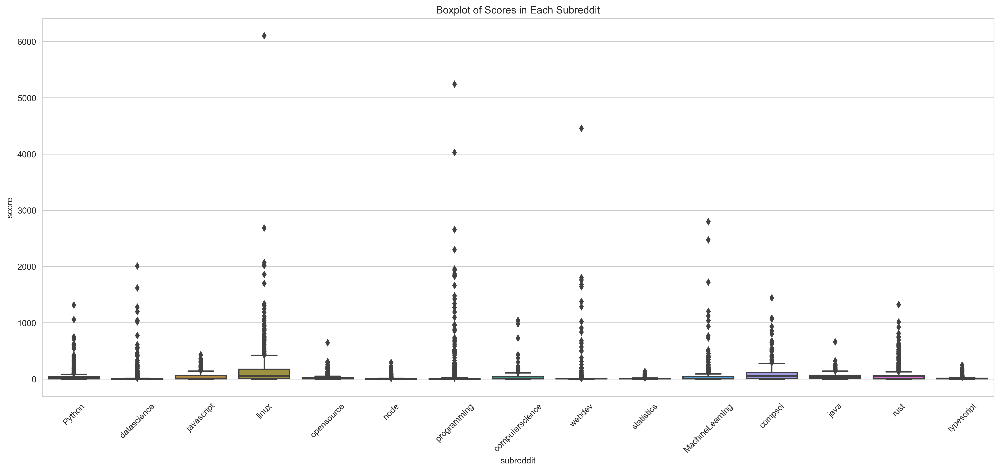

In [1129]:
# Boxplot of the scores in each subreddit
plt.figure(figsize=(20, 8))
plt.rcParams['figure.dpi'] = 300
plt.title('Boxplot of Scores in Each Subreddit')
plt.xlabel('Subreddit')
plt.ylabel('Score')
plt.xticks(rotation=45)
sns.boxplot(x='subreddit', y='score', data=df, palette=sns.color_palette("husl", 15))
plt.show()

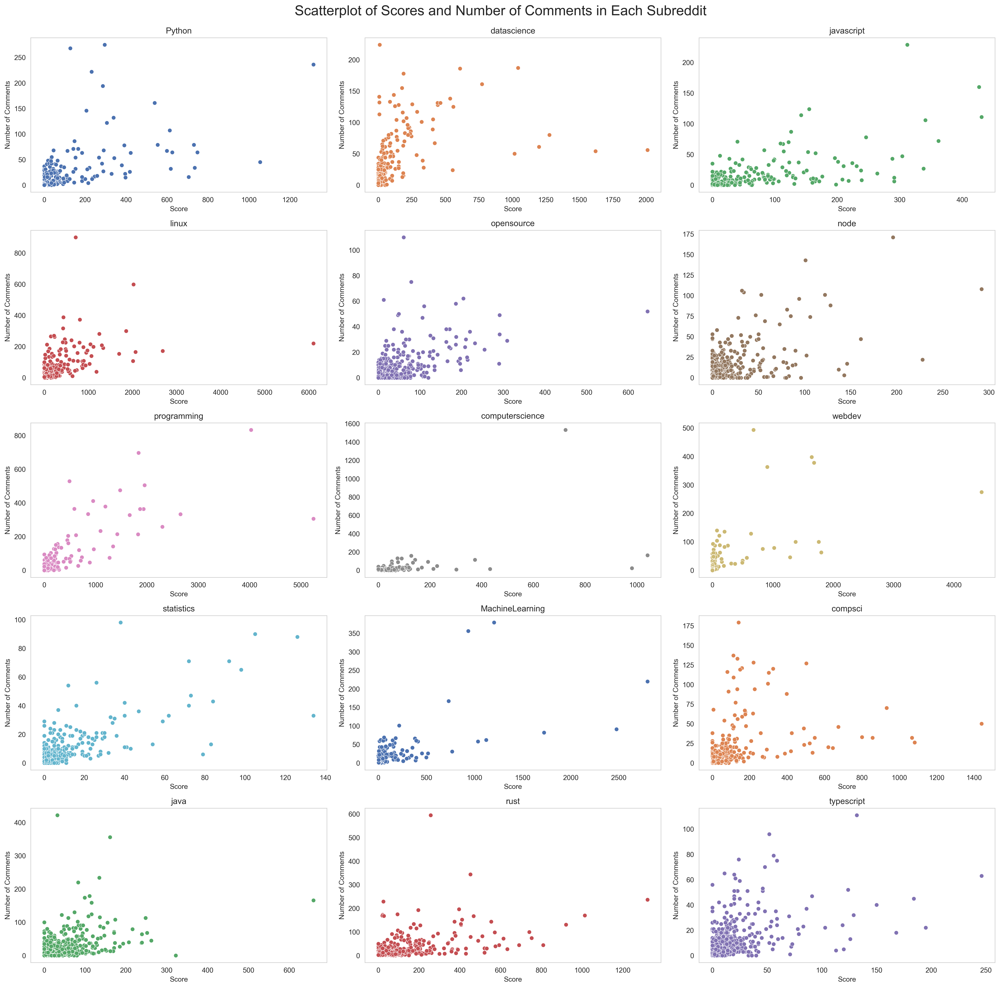

In [1130]:
# Scatterplot of the scores and number of comments in each subreddit
fig, axes = plt.subplots(5, 3, figsize=(20, 20))
fig.suptitle('Scatterplot of Scores and Number of Comments in Each Subreddit\n', fontsize=20)
fig.dpi = 300
palette=sns.color_palette("deep", 15)
for i, subreddit in enumerate(df['subreddit'].unique()):
    sns.scatterplot(x='score', y='num_comments', data=df[df['subreddit'] == subreddit], ax=axes[i//3, i%3], color=palette[i])
    axes[i//3, i%3].set_title(subreddit)
    axes[i//3, i%3].set_xlabel('Score')
    axes[i//3, i%3].set_ylabel('Number of Comments')
    axes[i//3, i%3].grid(False)
plt.tight_layout()
plt.show()

In [1131]:
# Time Features
df['created_utc'] = pd.to_datetime(df['created_utc'], unit='s')
df['hour'] = df['created_utc'].dt.hour
df['day'] = df['created_utc'].dt.day_name()
df.drop('created_utc', axis=1, inplace=True)

In [1132]:
# Define the variables
features = ['title', 'selftext', 'subreddit', 'link_flair_text', 'distinguished', 'author_premium', 'hour', 'day', 'is_original_content', 'over_18', 'spoiler']
targets = ['ups', 'num_comments']

# Drop columns that are not features or targets
for col in df.columns:
    if col not in features + targets:
        df.drop(col, axis=1, inplace=True)

In [1133]:
df.head()

,subreddit,selftext,title,ups,is_original_content,link_flair_text,author_premium,over_18,spoiler,distinguished,num_comments,hour,day
0,Python,Tell /r/python what you're working on this wee...,Sunday Daily Thread: What's everyone working o...,6,False,Daily Thread,False,False,False,True,9,0,Sunday
1,Python,Have some burning questions on advanced Python...,Tuesday Daily Thread: Advanced questions,2,False,Daily Thread,False,False,False,True,0,0,Tuesday
2,Python,"You might think that's a minor change, but [ne...",Flake8 took down the gitlab repository in favo...,61,False,News,False,False,False,False,3,23,Monday
3,Python,It's still a POC at this point as I am explori...,I made a CLI tool that helps you stay up to da...,69,False,Beginner Showcase,False,False,False,False,4,15,Monday
4,Python,,How to Create Python Packages for Sharing Code...,15,False,Tutorial,False,False,False,False,0,20,Monday


In [1134]:
from string import punctuation 

def preprocess(message):
    stemmer = SnowballStemmer('english')
    stuff_to_be_removed = list(stopwords.words('english'))+list(punctuation)

    # Convert message to lower case 
    message = message.lower()
    
    # Remove all the links from the messages 
    message = re.sub('http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+#]|[!*\(\),]|'\
                    '(?:%[0-9a-fA-F][0-9a-fA-F]))+','', message)
    # Remove all the mentions
    message =re.sub("(@[A-Za-z0-9_]+)","", message)

    # Remove all the emojis
    message = re.sub(re.compile("["
        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
        u"\U00002500-\U00002BEF"  # chinese char
        u"\U00002702-\U000027B0"
        u"\U00002702-\U000027B0"
        u"\U000024C2-\U0001F251"
        u"\U0001f926-\U0001f937"
        u"\U00010000-\U0010ffff"
        u"\u2640-\u2642" 
        u"\u2600-\u2B55"
        u"\u200d"
        u"\u23cf"
        u"\u23e9"
        u"\u231a"
        u"\ufe0f"  # dingbats
        u"\u3030"
        "]+", flags=re.UNICODE), '', message)

    # Remove HTML entities
    message = html.unescape(message)

    # strip blank spaces
    message = message.strip()

    # Remove all the punctuations
    message = message.translate(str.maketrans('', '', punctuation))

    # Remove stopwords and perform stemming 
    message = ' '.join([stemmer.stem(word) for word in message.split() if word not in stuff_to_be_removed])
    
    # Return the message 
    return message 

In [1135]:
text_features = ['title', 'selftext', 'link_flair_text']

# Preprocess the text features
for feature in text_features:
    df[feature] = df[feature].apply(lambda x: preprocess(x))

In [1136]:
df.head()

,subreddit,selftext,title,ups,is_original_content,link_flair_text,author_premium,over_18,spoiler,distinguished,num_comments,hour,day
0,Python,tell rpython your work week brag grous share p...,sunday daili thread what everyon work week,6,False,daili thread,False,False,False,True,9,0,Sunday
1,Python,burn question advanc python topic use thread a...,tuesday daili thread advanc question,2,False,daili thread,False,False,False,True,0,0,Tuesday
2,Python,might think that minor chang near 20k ci pipel...,flake8 took gitlab repositori favor github,61,False,news,False,False,False,False,3,23,Monday
3,Python,still poc point explor optim way structur proj...,made cli tool help stay date reddit twitter sp...,69,False,beginn showcas,False,False,False,False,4,15,Monday
4,Python,,creat python packag share code instal pip,15,False,tutori,False,False,False,False,0,20,Monday


In [1137]:
# Merge the text features
df['text'] = df[text_features[0]] + ' ' + df[text_features[1]]
df.drop(text_features[0], axis=1, inplace=True)
df.drop(text_features[1], axis=1, inplace=True)
categorical_features = ['subreddit', 'link_flair_text', 'day', 'hour', 'distinguished', 'author_premium', 'is_original_content', 'over_18', 'spoiler']
text_features = ['text']
df.head()

,subreddit,ups,is_original_content,link_flair_text,author_premium,over_18,spoiler,distinguished,num_comments,hour,day,text
0,Python,6,False,daili thread,False,False,False,True,9,0,Sunday,sunday daili thread what everyon work week tel...
1,Python,2,False,daili thread,False,False,False,True,0,0,Tuesday,tuesday daili thread advanc question burn ques...
2,Python,61,False,news,False,False,False,False,3,23,Monday,flake8 took gitlab repositori favor github mig...
3,Python,69,False,beginn showcas,False,False,False,False,4,15,Monday,made cli tool help stay date reddit twitter sp...
4,Python,15,False,tutori,False,False,False,False,0,20,Monday,creat python packag share code instal pip


# Machine Learning Models

- DummyRegressor
- LinearRegression
- RidgeCV
- KNeighborsRegressor
- DecisionTreeRegressor
- RandomForestRegressor
- GradientBoostingRegressor


In [1138]:
ups = df['ups']
num_comments = df['num_comments']
df.drop(['ups', 'num_comments'], axis=1, inplace=True)

# Create two separate dataframes for ups and num_comments
df_ups = df.copy()
df_ups['ups'] = ups
df_num_comments = df.copy()
df_num_comments['num_comments'] = num_comments

In [1139]:
# Split the data into train and test sets
from sklearn.model_selection import train_test_split

X_train_ups, X_test_ups, y_train_ups, y_test_ups = train_test_split(df_ups.drop('ups', axis=1), df_ups['ups'], test_size=0.2, random_state=42)

X_train_num_comments, X_test_num_comments, y_train_num_comments, y_test_num_comments = train_test_split(df_num_comments.drop('num_comments', axis=1), df_num_comments['num_comments'], test_size=0.2, random_state=42)

In [1140]:
# Import the necessary libraries
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import LabelBinarizer
from scipy.sparse import hstack


TfIdfVectorizer = TfidfVectorizer()
label_binarizer = LabelBinarizer()

# Generate the tf-idf vectors for the text features and binarize the categorical features
num_comments_cat =[label_binarizer.fit_transform(df[col]) for col in categorical_features]
num_comments_tfidf = TfIdfVectorizer.fit_transform(df['text'])
num_comments_X = hstack([num_comments_tfidf] + num_comments_cat).tocsr()
num_comments_y = df_num_comments['num_comments']

ups_cat =[label_binarizer.fit_transform(df[col]) for col in categorical_features]
ups_tfidf = TfIdfVectorizer.fit_transform(df['text'])
ups_X = hstack([ups_tfidf] + ups_cat).tocsr()
ups_y = df_ups['ups']

# Split the data into train and test sets
X_train_num_comments, X_test_num_comments, y_train_num_comments, y_test_num_comments = train_test_split(num_comments_X, num_comments_y, test_size=0.2, random_state=42)
X_train_ups, X_test_ups, y_train_ups, y_test_ups = train_test_split(ups_X, ups_y, test_size=0.2, random_state=42)


In [1141]:
# Shape of the dataframes
X_train_ups.shape, X_test_ups.shape, y_train_ups.shape, y_test_ups.shape

((6831, 32955), (1708, 32955), (6831,), (1708,))

In [1142]:
# Shapa la frada so data = :)
X_train_num_comments.shape, X_test_num_comments.shape, y_train_num_comments.shape, y_test_num_comments.shape

((6831, 32955), (1708, 32955), (6831,), (1708,))

In [1143]:
# Impot the necessary libraries 
import numpy as np
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.dummy import DummyRegressor
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import RidgeCV
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor

# Create a function to evaluate the models
def model_diagnostics(model, X_test, y_test, pr=True):
    """
    Returns and prints the R-squared, RMSE and the MAE for a trained model
    """
    y_predicted = model.predict(X_test)
    r2 = r2_score(y_test, y_predicted)
    mse = mean_squared_error(y_test, y_predicted)
    mae = mean_absolute_error(y_test, y_predicted)
    if pr:
        print(f"R-Sq: {r2:.4}")
        print(f"RMSE: {np.sqrt(mse)}")
        print(f"MAE: {mae}")
    
    return [r2,np.sqrt(mse),mae]


In [1144]:
ups_model_performance_dict = dict()
num_comments_model_performance_dict = dict()
model_dir = 'models/'
import os
import pickle

# Create a function to save the models
def save_model(model, model_name):
    """
    Saves the model to the models/ directory
    """
    if not os.path.exists(model_dir):
        os.mkdir(model_dir)
    with open(model_dir + model_name + '.pkl', 'wb') as f:
        pickle.dump(model, f)


# Create a hash table to store the model objects
model_hashmap = {
    "DummyRegressor": DummyRegressor(),
    "LinearRegression": LinearRegression(),
    "RidgeCV": RidgeCV(cv=10),
    "KNeighborsRegressor": KNeighborsRegressor(),
    "DecisionTreeRegressor": DecisionTreeRegressor(min_samples_split=45, min_samples_leaf=45, random_state = 10),
    "RandomForestRegressor": RandomForestRegressor(n_jobs=-1, n_estimators=70, min_samples_leaf=10, random_state = 10),
    "GradientBoostingRegressor": GradientBoostingRegressor(n_estimators=70, max_depth=5)
}

# Train the models
for model_name, model in model_hashmap.items():
    print("Processing model: ", model_name)

    # Ups
    model.fit(X_train_ups, y_train_ups)
    ups_model_performance_dict[model_name] = model_diagnostics(model, X_test_ups, y_test_ups)
    save_model(model, model_name + '_ups')

    # Num Comments
    model.fit(X_train_num_comments, y_train_num_comments)
    num_comments_model_performance_dict[model_name] = model_diagnostics(model, X_test_num_comments, y_test_num_comments)
    save_model(model, model_name + '_num_comments')


Processing model:  DummyRegressor
R-Sq: -5.377e-05
RMSE: 168.57835585807706
MAE: 66.3841445373876
R-Sq: -0.0001668
RMSE: 34.60368705510184
MAE: 16.599886709473314
Processing model:  LinearRegression
R-Sq: -7.24
RMSE: 483.8911066031549
MAE: 364.6031576028253
R-Sq: -23.81
RMSE: 172.33397915980666
MAE: 134.35497986463744
Processing model:  RidgeCV
R-Sq: 0.06052
RMSE: 163.39339308332723
MAE: 62.53285995632656
R-Sq: 0.09219
RMSE: 32.96729563571388
MAE: 15.62363782392323
Processing model:  KNeighborsRegressor
R-Sq: -0.08634
RMSE: 175.70085919076976
MAE: 61.92213114754098
R-Sq: -0.2066
RMSE: 38.00755687216821
MAE: 17.375175644028104
Processing model:  DecisionTreeRegressor
R-Sq: 0.05146
RMSE: 164.1794809323265
MAE: 61.55650033386611
R-Sq: 0.05239
RMSE: 33.68222710741917
MAE: 16.064812285932884
Processing model:  RandomForestRegressor
R-Sq: 0.03842
RMSE: 165.30402281539057
MAE: 60.911719114897956
R-Sq: 0.08683
RMSE: 33.06455054071745
MAE: 15.179692752917617
Processing model:  GradientBoostingR

In [1152]:
# Compare model performance
ups_model_performance_df = pd.DataFrame.from_dict(ups_model_performance_dict, orient='index', columns=['R-Sq', 'RMSE', 'MAE'])
ups_model_performance_df.sort_values(by='R-Sq', ascending=False)

,R-Sq,RMSE,MAE
RidgeCV,0.060517,163.393393,62.532860
DecisionTreeRegressor,0.051456,164.179481,61.556500
RandomForestRegressor,0.038417,165.304023,60.911719
DummyRegressor,-0.000054,168.578356,66.384145
KNeighborsRegressor,-0.086344,175.700859,61.922131
GradientBoostingRegressor,-0.145187,180.396561,64.375011
LinearRegression,-7.239768,483.891107,364.603158


In [1153]:

num_comments_model_performance_df = pd.DataFrame.from_dict(num_comments_model_performance_dict, orient='index', columns=['R-Sq', 'RMSE', 'MAE'])
num_comments_model_performance_df.sort_values(by='R-Sq', ascending=False)

,R-Sq,RMSE,MAE
RidgeCV,0.092191,32.967296,15.623638
RandomForestRegressor,0.086827,33.064551,15.179693
DecisionTreeRegressor,0.052391,33.682227,16.064812
DummyRegressor,-0.000167,34.603687,16.599887
GradientBoostingRegressor,-0.187267,37.701648,16.180678
KNeighborsRegressor,-0.206612,38.007557,17.375176
LinearRegression,-23.806729,172.333979,134.354980


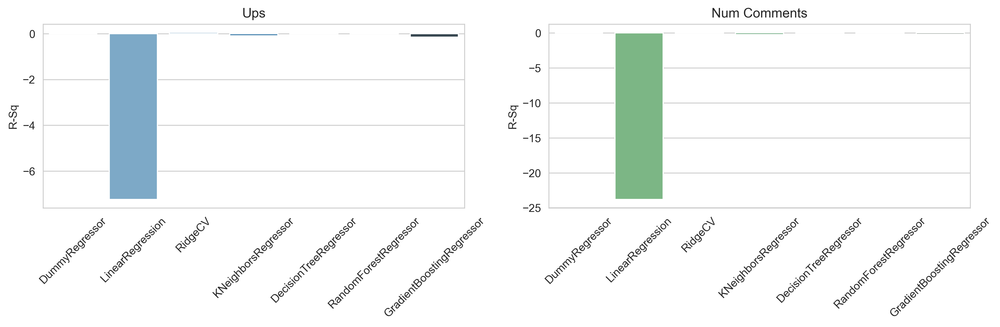

In [1146]:
# R Squares
fig, ax = plt.subplots(1, 2, figsize=(15, 3))
sns.barplot(x=ups_model_performance_df.index, y=ups_model_performance_df['R-Sq'], ax=ax[0], palette='Blues_d')
sns.barplot(x=num_comments_model_performance_df.index, y=num_comments_model_performance_df['R-Sq'], ax=ax[1], palette='Greens_d')
ax[0].set_title('Ups')
ax[1].set_title('Num Comments')
for i in range(2):
    ax[i].set_xticklabels(ax[i].get_xticklabels(), rotation=45)
plt.show()

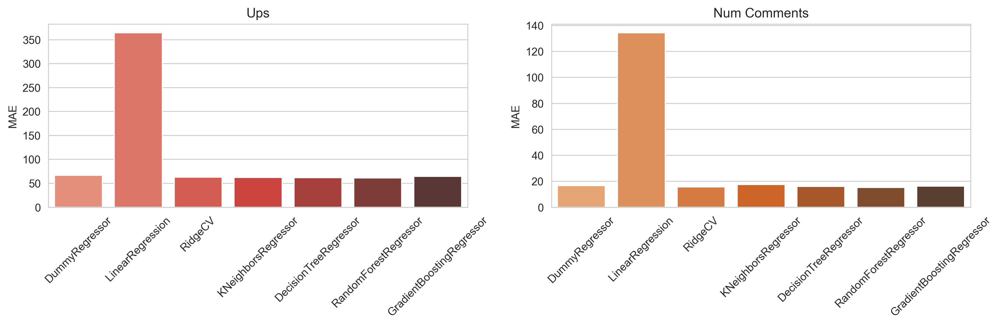

In [1147]:
# MAE
fig, ax = plt.subplots(1, 2, figsize=(15, 3))
sns.barplot(x=ups_model_performance_df.index, y=ups_model_performance_df['MAE'], ax=ax[0], palette='Reds_d')
sns.barplot(x=num_comments_model_performance_df.index, y=num_comments_model_performance_df['MAE'], ax=ax[1], palette='Oranges_d')
ax[0].set_title('Ups')
ax[1].set_title('Num Comments')
for i in range(2):
    ax[i].set_xticklabels(ax[i].get_xticklabels(), rotation=45)
plt.show()


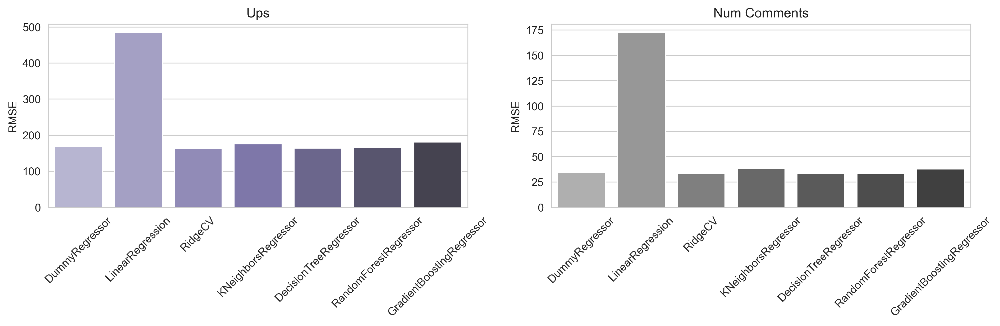

In [1148]:
# RMSE
fig, ax = plt.subplots(1, 2, figsize=(15, 3))
sns.barplot(x=ups_model_performance_df.index, y=ups_model_performance_df['RMSE'], ax=ax[0], palette='Purples_d')
sns.barplot(x=num_comments_model_performance_df.index, y=num_comments_model_performance_df['RMSE'], ax=ax[1], palette='Greys_d')
ax[0].set_title('Ups')
ax[1].set_title('Num Comments')
for i in range(2):
    ax[i].set_xticklabels(ax[i].get_xticklabels(), rotation=45)
plt.show()

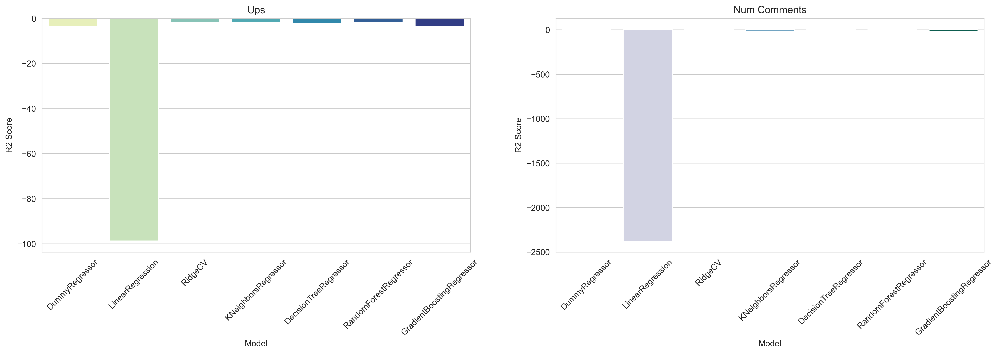

In [1149]:
# R2 Score Comparison Plot
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(20, 5))

# Ups
ax[0].set_title('Ups')
ax[0].set_xlabel('Model')
ax[0].set_ylabel('R2 Score')
sns.barplot(x=ups_model_performance_df.index, y=[round(model_hashmap[model_name].score(X_test_ups, y_test_ups) * 100, 2) for model_name in ups_model_performance_df.index], ax=ax[0], palette='YlGnBu')

# Num Comments
ax[1].set_title('Num Comments')
ax[1].set_xlabel('Model')
ax[1].set_ylabel('R2 Score')
sns.barplot(x=num_comments_model_performance_df.index, y=[round(model_hashmap[model_name].score(X_test_num_comments, y_test_num_comments) * 100, 2) for model_name in num_comments_model_performance_df.index], ax=ax[1], palette='PuBuGn')

for ax in fig.axes:
    plt.sca(ax)
    plt.xticks(rotation=45)

plt.show()


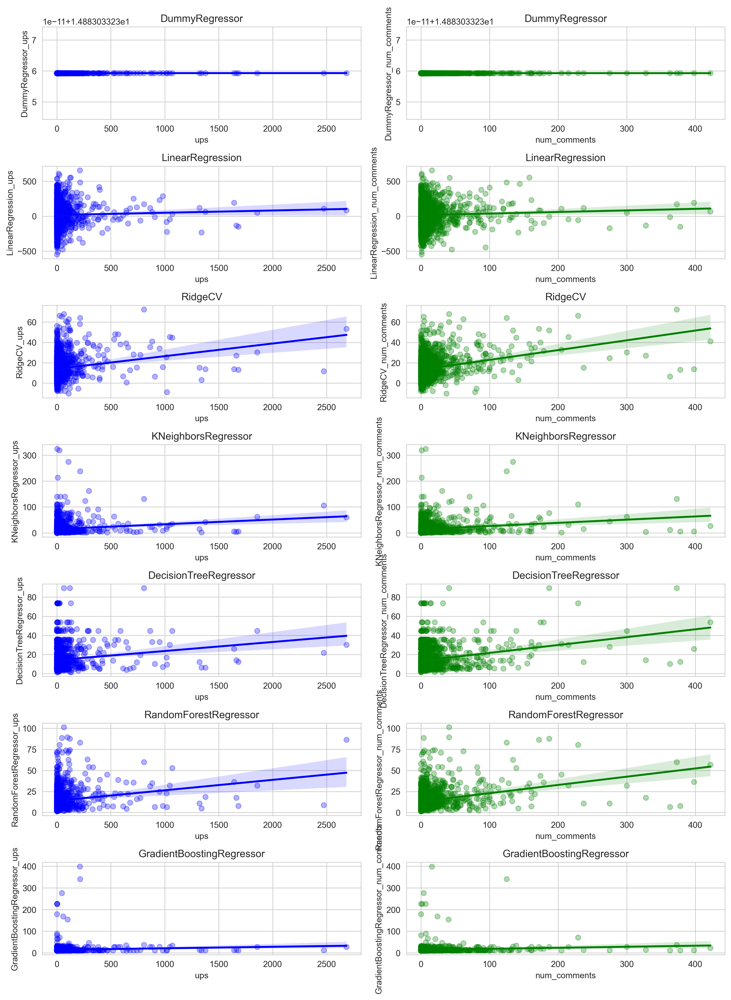

In [1150]:
# Predictions
predictions = pd.DataFrame()

# Ups
for model_name, model in model_hashmap.items():
    predictions[model_name + '_ups'] = model.predict(X_test_ups)

# Num Comments
for model_name, model in model_hashmap.items():
    predictions[model_name + '_num_comments'] = model.predict(X_test_num_comments)

# Actual
actual = pd.DataFrame()
actual['ups'] = y_test_ups
actual['num_comments'] = y_test_num_comments


# Actual vs Predicted Plot
fig, ax = plt.subplots(7, 2, figsize=(12, 16))

for i, model_name in enumerate(model_hashmap.keys()):
    # ups
    ax[i, 0].set_title(model_name)
    ax[i, 0].set_xlabel('Actual')
    ax[i, 0].set_ylabel('Predicted')
    sns.regplot(x=actual['ups'], y=predictions[model_name + '_ups'], ax=ax[i, 0], color='blue', scatter_kws={'alpha': 0.3})

    # num comments
    ax[i, 1].set_title(model_name)
    ax[i, 1].set_xlabel('Actual')
    ax[i, 1].set_ylabel('Predicted')
    sns.regplot(x=actual['num_comments'], y=predictions[model_name + '_num_comments'], ax=ax[i, 1], color='g', scatter_kws={'alpha': 0.3})

plt.tight_layout()
plt.show()

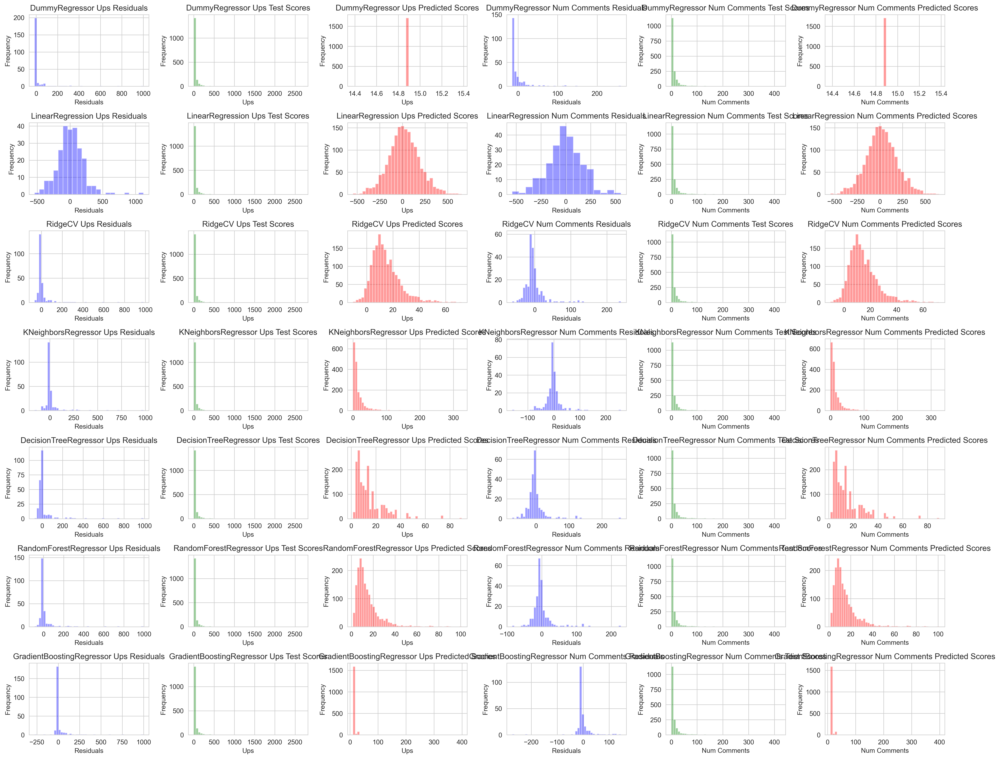

In [1151]:
# Plotting Residuals
""""
Plot the distribution for actual and predicted values of the target variable. Also plot the distribution for the residuals
"""
fig, ax = plt.subplots(7, 6, figsize=(20, 16))

for i, model_name in enumerate(model_hashmap.keys()):
    # ups model
    sns.distplot(actual['ups'] - predictions[model_name + '_ups'], ax=ax[i, 0], color='blue', kde=False)
    ax[i, 0].set_title(model_name + ' Ups Residuals')
    ax[i, 0].set_xlabel('Residuals')
    ax[i, 0].set_ylabel('Frequency')

    sns.distplot(actual['ups'], ax=ax[i, 1], kde=False, color='green')
    ax[i, 1].set_title(model_name + ' Ups Test Scores')
    ax[i, 1].set_xlabel('Ups')
    ax[i, 1].set_ylabel('Frequency')

    sns.distplot(predictions[model_name + '_ups'], ax=ax[i, 2], kde=False, color='red')
    ax[i, 2].set_title(model_name + ' Ups Predicted Scores')
    ax[i, 2].set_xlabel('Ups')
    ax[i, 2].set_ylabel('Frequency')

    # num comments model
    sns.distplot(actual['num_comments'] - predictions[model_name + '_num_comments'], ax=ax[i, 3], color='blue', kde=False)
    ax[i, 3].set_title(model_name + ' Num Comments Residuals')
    ax[i, 3].set_xlabel('Residuals')
    ax[i, 3].set_ylabel('Frequency')

    sns.distplot(actual['num_comments'], ax=ax[i, 4], kde=False, color='green')
    ax[i, 4].set_title(model_name + ' Num Comments Test Scores')
    ax[i, 4].set_xlabel('Num Comments')
    ax[i, 4].set_ylabel('Frequency')
    
    sns.distplot(predictions[model_name + '_num_comments'], ax=ax[i, 5], kde=False, color='red')
    ax[i, 5].set_title(model_name + ' Num Comments Predicted Scores')
    ax[i, 5].set_xlabel('Num Comments')
    ax[i, 5].set_ylabel('Frequency')

plt.tight_layout()
plt.show()